<a href="https://colab.research.google.com/github/adhhamrp/Loan-Status/blob/main/Loan_status_hackathon_P1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#***Loan Status Hackathon***

## 1.Installing Packages

In [ ]:
!pip install pycaret

     |████████████████████████████████| 288 kB 30.0 MB/s 
     |████████████████████████████████| 261 kB 55.7 MB/s 
     |████████████████████████████████| 86 kB 5.5 MB/s 
     |████████████████████████████████| 2.0 MB 48.6 MB/s 
     |████████████████████████████████| 113 kB 55.8 MB/s 
     |████████████████████████████████| 56 kB 4.6 MB/s 
     |████████████████████████████████| 1.7 MB 43.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 167 kB 71.0 MB/s 
     |████████████████████████████████| 6.8 MB 34.9 MB/s 
     |████████████████████████████████| 1.3 MB 60.1 MB/s 
     |████████████████████████████████| 15.5 MB 36.9 MB/s 
     |████████████████████████████████| 596 kB 44.0 MB/s 
     |████████████████████████████████| 675 kB 38.1 MB/s 
     |████████████████████████████████| 303 kB 60.3 MB/s 
     |████████████████

In [ ]:
import pycaret
import pandas as pd
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
from pycaret.classification import *
%matplotlib inline

In [ ]:
!pip install AutoViz -q
!pip install xgboost

     |████████████████████████████████| 52 kB 971 kB/s 
     |████████████████████████████████| 3.1 MB 43.0 MB/s 
     |████████████████████████████████| 12.9 MB 38.4 MB/s 
     |████████████████████████████████| 88 kB 8.0 MB/s 
     |████████████████████████████████| 11.2 MB 57.5 MB/s 
     |████████████████████████████████| 18.5 MB 1.3 MB/s 
     |████████████████████████████████| 884 kB 32.4 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
!pip install pandas-profiling  -q

##2.Data Collection

###Dataset Description

Banks run into losses when a customer doesn't pay their loans on time. Because of this, every year, banks have losses in crores, and this also impacts the country's economic growth to a large extent. In this hackathon, we look at various attributes such as funded amount, location, loan, balance, etc., to predict if a person will be a loan defaulter or not. 

###Task Objective

Implement a classification model for the dataset with good prediction results. To predict if a person will be a loan defaulter or not, we look at various attributes such as funded amount, location, loan, balance, etc.

###Obtaining data and connecting it to colab

In [ ]:
loan_train = pd.read_csv("/content/train.csv")

In [ ]:
test_data = pd.read_csv("/content/test.csv")

In [ ]:
loan_train_backup = loan_train

In [ ]:
loan_train_backup.head()

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.36286,59,BAT2522922,11.135007,B,C4,MORTGAGE,176346.62670,Not Verified,n,Debt Consolidation,16.284758,1,0,13,0,24246,74.932551,7,w,2929.646315,0.102055,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.99692,59,BAT1586599,12.237563,C,D3,RENT,39833.92100,Source Verified,n,Debt consolidation,15.412409,0,0,12,0,812,78.297186,13,f,772.769385,0.036181,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.22455,59,BAT2136391,12.545884,F,D4,MORTGAGE,91506.69105,Source Verified,n,Debt Consolidation,28.137619,0,0,14,0,1843,2.073040,20,w,863.324396,18.778660,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.15585,59,BAT2428731,16.731201,C,C3,MORTGAGE,108286.57590,Source Verified,n,Debt consolidation,18.043730,1,0,7,0,13819,67.467951,12,w,288.173196,0.044131,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.92667,59,BAT5341619,15.008300,C,D4,MORTGAGE,44234.82545,Source Verified,n,Credit card refinancing,17.209886,1,3,13,1,1544,85.250761,22,w,129.239553,19.306646,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0


In [ ]:
#loan_train.drop('ID',axis=1,inplace=True)  #removing column ID

In [ ]:
loan_train.head()

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.36286,59,BAT2522922,11.135007,B,C4,MORTGAGE,176346.62670,Not Verified,n,Debt Consolidation,16.284758,1,0,13,0,24246,74.932551,7,w,2929.646315,0.102055,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.99692,59,BAT1586599,12.237563,C,D3,RENT,39833.92100,Source Verified,n,Debt consolidation,15.412409,0,0,12,0,812,78.297186,13,f,772.769385,0.036181,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.22455,59,BAT2136391,12.545884,F,D4,MORTGAGE,91506.69105,Source Verified,n,Debt Consolidation,28.137619,0,0,14,0,1843,2.073040,20,w,863.324396,18.778660,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.15585,59,BAT2428731,16.731201,C,C3,MORTGAGE,108286.57590,Source Verified,n,Debt consolidation,18.043730,1,0,7,0,13819,67.467951,12,w,288.173196,0.044131,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.92667,59,BAT5341619,15.008300,C,D4,MORTGAGE,44234.82545,Source Verified,n,Credit card refinancing,17.209886,1,3,13,1,1544,85.250761,22,w,129.239553,19.306646,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0


In [ ]:
loan_train.shape #finding shape

(67463, 35)

In [ ]:
loan_train.info() #getting dataset details

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67463 entries, 0 to 67462
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            67463 non-null  int64  
 1   Loan Amount                   67463 non-null  int64  
 2   Funded Amount                 67463 non-null  int64  
 3   Funded Amount Investor        67463 non-null  float64
 4   Term                          67463 non-null  int64  
 5   Batch Enrolled                67463 non-null  object 
 6   Interest Rate                 67463 non-null  float64
 7   Grade                         67463 non-null  object 
 8   Sub Grade                     67463 non-null  object 
 9   Employment Duration           67463 non-null  object 
 10  Home Ownership                67463 non-null  float64
 11  Verification Status           67463 non-null  object 
 12  Payment Plan                  67463 non-null  object 
 13  L

In [ ]:
loan_train.isnull().sum()

ID                              0
Loan Amount                     0
Funded Amount                   0
Funded Amount Investor          0
Term                            0
Batch Enrolled                  0
Interest Rate                   0
Grade                           0
Sub Grade                       0
Employment Duration             0
Home Ownership                  0
Verification Status             0
Payment Plan                    0
Loan Title                      0
Debit to Income                 0
Delinquency - two years         0
Inquires - six months           0
Open Account                    0
Public Record                   0
Revolving Balance               0
Revolving Utilities             0
Total Accounts                  0
Initial List Status             0
Total Received Interest         0
Total Received Late Fee         0
Recoveries                      0
Collection Recovery Fee         0
Collection 12 months Medical    0
Application Type                0
Last week Pay 

In [ ]:
loan_train.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
67458    False
67459    False
67460    False
67461    False
67462    False
Length: 67463, dtype: bool

In [ ]:
loan_train.describe()  #obtaining statistical summary

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Home Ownership,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
count,6.746300e+04,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.000000,67463.0,67463.000000,6.746300e+04,67463.000000,67463.000000
mean,2.562761e+07,16848.902776,15770.599114,14621.799323,58.173814,11.846258,80541.502522,23.299241,0.327127,0.145754,14.266561,0.081437,7699.342425,52.889443,18.627929,2068.992542,1.143969,59.691578,1.125141,0.021301,71.163260,0.0,146.467990,1.595739e+05,23123.005544,0.092510
std,2.109155e+07,8367.865726,8150.992662,6785.345170,3.327441,3.718629,45029.120366,8.451824,0.800888,0.473291,6.225060,0.346606,7836.148190,22.539450,8.319246,2221.918745,5.244365,357.026346,3.489885,0.144385,43.315845,0.0,744.382233,1.390332e+05,20916.699999,0.289747
min,1.297933e+06,1014.000000,1014.000000,1114.590204,36.000000,5.320006,14573.537170,0.675299,0.000000,0.000000,2.000000,0.000000,0.000000,0.005172,4.000000,4.736746,0.000003,0.000036,0.000036,0.000000,0.000000,0.0,1.000000,6.170000e+02,1000.000000,0.000000
25%,6.570288e+06,10012.000000,9266.500000,9831.684984,58.000000,9.297147,51689.843335,16.756416,0.000000,0.000000,10.000000,0.000000,2557.000000,38.658825,13.000000,570.903814,0.021114,1.629818,0.476259,0.000000,35.000000,0.0,24.000000,5.037900e+04,8155.500000,0.000000
50%,1.791565e+07,16073.000000,13042.000000,12793.682170,59.000000,11.377696,69335.832680,22.656658,0.000000,0.000000,13.000000,0.000000,5516.000000,54.082334,18.000000,1330.842771,0.043398,3.344524,0.780141,0.000000,68.000000,0.0,36.000000,1.183690e+05,16733.000000,0.000000
75%,4.271521e+07,22106.000000,21793.000000,17807.594120,59.000000,14.193533,94623.322785,30.048400,0.000000,0.000000,16.000000,0.000000,10184.500000,69.177117,23.000000,2656.956837,0.071884,5.453727,1.070566,0.000000,105.000000,0.0,46.000000,2.283750e+05,32146.500000,0.000000
max,7.224578e+07,35000.000000,34999.000000,34999.746430,59.000000,27.182348,406561.536400,39.629862,8.000000,5.000000,37.000000,4.000000,116933.000000,100.880050,72.000000,14301.368310,42.618882,4354.467419,166.833000,1.000000,161.000000,0.0,16421.000000,1.177412e+06,201169.000000,1.000000


##3.Exploratory Data Analysis (EDA)

###Data Visualisation

Imported AutoViz_Class version: 0.1.27. Now you can save all charts in html format:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Note: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
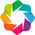

In [ ]:
from IPython.display import SVG
import autoviz
from autoviz.AutoViz_Class import AutoViz_Class

AViz = AutoViz_Class()

In [ ]:
pandas_profiling.ProfileReport(loan_train,minimal=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

ImportError: ignored

***Target Column Name***

In [ ]:
target_name="Loan Status"#@param {type: "string"}

In [ ]:
#AViz.AutoViz(filename="", sep=',', depVar=target_name, dfte=loan_train, header=1, verbose=2,chart_format="svg")

In [ ]:
#SVG('/content/AutoViz_Plots/Loan Status/Scatter_Plots.svg'.format(target_name))

In [ ]:
loan_train.head()

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.36286,59,BAT2522922,11.135007,B,C4,MORTGAGE,176346.62670,Not Verified,n,Debt Consolidation,16.284758,1,0,13,0,24246,74.932551,7,w,2929.646315,0.102055,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.99692,59,BAT1586599,12.237563,C,D3,RENT,39833.92100,Source Verified,n,Debt consolidation,15.412409,0,0,12,0,812,78.297186,13,f,772.769385,0.036181,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.22455,59,BAT2136391,12.545884,F,D4,MORTGAGE,91506.69105,Source Verified,n,Debt Consolidation,28.137619,0,0,14,0,1843,2.073040,20,w,863.324396,18.778660,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.15585,59,BAT2428731,16.731201,C,C3,MORTGAGE,108286.57590,Source Verified,n,Debt consolidation,18.043730,1,0,7,0,13819,67.467951,12,w,288.173196,0.044131,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.92667,59,BAT5341619,15.008300,C,D4,MORTGAGE,44234.82545,Source Verified,n,Credit card refinancing,17.209886,1,3,13,1,1544,85.250761,22,w,129.239553,19.306646,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0


###EDA Report

**1. Missing values  :**  Nil

**2. Duplicate Rows  :**  Nil

**3. Data types of columns  :**  

    Numeric Columns: ['Funded Amount Investor', 'Interest Rate', 'Home Ownership', 'Debit to Income', 'Revolving Utilities', 'Total Received Interest', 'Total Received Late Fee', 'Recoveries', 'Collection Recovery Fee']
    Integer-Categorical Columns: ['Loan Amount', 'Funded Amount', 'Term', 'Delinquency - two years', 'Inquires - six months', 'Open Account', 'Public Record', 'Revolving Balance', 'Total Accounts', 'Last week Pay', 'Total Collection Amount', 'Total Current Balance', 'Total Revolving Credit Limit']
    String-Categorical Columns: ['Grade', 'Sub Grade', 'Employment Duration', 'Verification Status']
    String-Boolean Columns: ['Initial List Status', 'Application Type']
    Numeric-Boolean Columns: ['Collection 12 months Medical']
    Discrete String Columns: ['Batch Enrolled', 'Loan Title']
    ID Columns: ['ID']

**4. Perfect_collinearity (100 %colinear problem solving) and multi colinearity:**  NIL

**5. Skewness and Kurtosis**
    

**6. Scale of column range**

    scaling is required


**7. Extreme values or outliers**

    Extreme values present in 'Total current balance' column

**8. Low variance Columns**

    Accounts Delinquent,payment plan columns are having low variance

**9. Balance in count between target column categories**

    Imbalance is found in Target column

**10. Ignore features- id columns ,unique name,serial number etc. pass list of column names in a list to remove them from training**

    id,payment plan,Accounts Delinquent

**11. High cardinality -categorical columns which have category items count more than 10-20 or more**

    Loan Title is having high cardinality

**12. Central tendency values**

    Mean,Median,Mode of each columns

**13. Count of rows and columns**

    67463 rows and 35 columns


##4.Data Pre-Processing

###Drop Duplicates

In [ ]:
loan_train.shape

(67463, 35)

In [ ]:
data=loan_train.dropna(subset=['Loan Status'],axis=0,how='any')#checks for missing in target column

Using test

In [ ]:
test_data.shape

(28913, 35)

In [ ]:
data=test_data.dropna(subset=['Loan Status'],axis=0,how='any')#checks for missing in target column

###Column re arrangement

Loan Title column re-arrangement

In [ ]:
loan_train['Loan Title'].unique()

array(['Debt Consolidation', 'Debt consolidation',
       'Credit card refinancing', 'Home improvement',
       'Credit Consolidation', 'Green loan', 'Other',
       'Moving and relocation', 'Credit Cards', 'Medical expenses',
       'DEBT CONSOLIDATION', 'Home Improvement', 'Refinance',
       'credit card consolidation', 'Lending Club',
       'Debt Consolidation Loan', 'Major purchase', 'Vacation',
       'Business', 'Credit card payoff', 'Credit Card Consolidation',
       'credit card', 'Credit Card Refi', 'Personal Loan', 'CC Refi',
       'consolidate', 'Medical', 'Loan 1', 'Consolidation',
       'Card Consolidation', 'Car financing', 'debt', 'home improvement',
       'debt consolidation', 'Home buying', 'Freedom', 'Consolidate',
       'Consolidated', 'get out of debt', 'consolidation loan',
       'Dept consolidation', 'Personal loan', 'Personal', 'Debt', 'cards',
       'Cards', 'Bathroom', 'refi', 'Credit Card Loan',
       'Credit Card Debt', 'House', 'Debt Consolidation 

In [ ]:
y=list(loan_train['Loan Title'].unique())

In [ ]:
y.sort()
y

['Bathroom',
 'Bill Consolidation',
 'Bill Payoff',
 'Business',
 'CC',
 'CC Consolidation',
 'CC Loan',
 'CC Refi',
 'CC Refinance',
 'CC consolidation',
 'CC-Refinance',
 'CONSOLIDATE',
 'CONSOLIDATION',
 'Car Loan',
 'Car financing',
 'Card Consolidation',
 'Cards',
 'Consolidate',
 'Consolidated',
 'Consolidation',
 'Consolidation Loan',
 'Credit',
 'Credit Card',
 'Credit Card Consolidation',
 'Credit Card Debt',
 'Credit Card Loan',
 'Credit Card Paydown',
 'Credit Card Payoff',
 'Credit Card Refi',
 'Credit Card Refinance',
 'Credit Card Refinance Loan',
 'Credit Card consolidation',
 'Credit Cards',
 'Credit Consolidation',
 'Credit Loan',
 'Credit card pay off',
 'Credit card payoff',
 'Credit card refinance',
 'Credit card refinancing',
 'Credit payoff',
 'DEBT CONSOLIDATION',
 'Debt',
 'Debt Consolidation',
 'Debt Consolidation 2013',
 'Debt Consolidation Loan',
 'Debt Free',
 'Debt Loan',
 'Debt Payoff',
 'Debt Reduction',
 'Debt consolidation',
 'Debt payoff',
 'Dept conso

In [ ]:
len(y)

109

In [ ]:
loan_train['Loan Title']=loan_train['Loan Title'].str.lower()

In [ ]:
test_data['Loan Title']=test_data['Loan Title'].str.lower()

In [ ]:
loan_train['Loan Title'].head()

0         debt consolidation
1         debt consolidation
2         debt consolidation
3         debt consolidation
4    credit card refinancing
Name: Loan Title, dtype: object

In [ ]:
y1=list(loan_train['Loan Title'].unique())

In [ ]:
y1.sort()
y1

['bathroom',
 'bill consolidation',
 'bill payoff',
 'bills',
 'business',
 'car financing',
 'car loan',
 'card consolidation',
 'cards',
 'cc',
 'cc consolidation',
 'cc loan',
 'cc refi',
 'cc refinance',
 'cc-refinance',
 'conso',
 'consolidate',
 'consolidated',
 'consolidation',
 'consolidation loan',
 'credit',
 'credit card',
 'credit card consolidation',
 'credit card debt',
 'credit card loan',
 'credit card pay off',
 'credit card paydown',
 'credit card payoff',
 'credit card refi',
 'credit card refinance',
 'credit card refinance loan',
 'credit card refinancing',
 'credit cards',
 'credit consolidation',
 'credit loan',
 'credit pay off',
 'credit payoff',
 'debt',
 'debt consolidation',
 'debt consolidation 2013',
 'debt consolidation loan',
 'debt free',
 'debt loan',
 'debt payoff',
 'debt reduction',
 'dept consolidation',
 'freedom',
 'get debt free',
 'get out of debt',
 'getting ahead',
 'green loan',
 'home',
 'home buying',
 'home improvement',
 'home improvemen

In [ ]:
loan_train['new_Loan Title'] = loan_train['Loan Title'].replace(['cc refi','cc-refinance'],'cc refinance')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['bill consolidation','bills'],'bill payoff')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace('car financing','car loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['cc','cc consolidation','cc loan'],'cc refinance')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['card consolidation','cards','credit card','credit cards'],'credit card consolidation')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['conso','consolidate','consolidated','consolidation'],'consolidation loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace('credit card pay off','credit card payoff')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['credit card refi','credit card refinance loan','credit card refinancing'],'credit card refinance')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['credit','credit loan','credit pay off'],'credit payoff')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['debt consolidation','debt consolidation 2013','dept consolidation'],'debt consolidation loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['debt','debt free','debt payoff','debt reduction','freedom','get debt free','get out of debt'],'debt loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['home','home buying','home improvement','home improvement loan','house'],'home loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace('loan1','loan 1')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['medical','medical expenses'],'medical loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace('myloan','my loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['payoff','pay off bills'],'pay off')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['personal'],'personal loan')

In [ ]:
loan_train['new_Loan Title'] = loan_train['new_Loan Title'].replace(['refi','refinance'],'refinance loan')

In [ ]:
y2=list(loan_train['new_Loan Title'].unique())
y2.sort()
y2

['bathroom',
 'bill payoff',
 'business',
 'car loan',
 'cc refinance',
 'consolidation loan',
 'credit card consolidation',
 'credit card debt',
 'credit card loan',
 'credit card paydown',
 'credit card payoff',
 'credit card refinance',
 'credit consolidation',
 'credit payoff',
 'debt consolidation loan',
 'debt loan',
 'getting ahead',
 'green loan',
 'home loan',
 'lending club',
 'lending loan',
 'loan',
 'loan 1',
 'loan consolidation',
 'major purchase',
 'medical loan',
 'moving and relocation',
 'my loan',
 'other',
 'pay off',
 'personal loan',
 'pool',
 'refinance loan',
 'relief',
 'vacation',
 'wedding loan']

Re-arranging Sub Grade column

In [ ]:
x1=list(loan_train['Sub Grade'].unique())
x1.sort()
x1

['A1',
 'A2',
 'A3',
 'A4',
 'A5',
 'B1',
 'B2',
 'B3',
 'B4',
 'B5',
 'C1',
 'C2',
 'C3',
 'C4',
 'C5',
 'D1',
 'D2',
 'D3',
 'D4',
 'D5',
 'E1',
 'E2',
 'E3',
 'E4',
 'E5',
 'F1',
 'F2',
 'F3',
 'F4',
 'F5',
 'G1',
 'G2',
 'G3',
 'G4',
 'G5']

In [ ]:
loan_train['Subgrade_new']=loan_train['Sub Grade'].replace(['A2','A3','A4','A5'],'A1')

In [ ]:
loan_train['Subgrade_new']=loan_train['Subgrade_new'].replace(['B2','B3','B4','B5'],'B1')

In [ ]:
loan_train['Subgrade_new']=loan_train['Subgrade_new'].replace(['C2','C3','C4','C5'],'C1')

In [ ]:
loan_train['Subgrade_new']=loan_train['Subgrade_new'].replace(['D2','D3','D4','D5'],'D1')

In [ ]:
loan_train['Subgrade_new']=loan_train['Subgrade_new'].replace(['E2','E3','E4','E5'],'E1')

In [ ]:
loan_train['Subgrade_new']=loan_train['Subgrade_new'].replace(['F2','F3','F4','F5'],'F1')

In [ ]:
loan_train['Subgrade_new']=loan_train['Subgrade_new'].replace(['G2','G3','G4','G5'],'G1')

In [ ]:
#loan_train.drop(columns=['ID','Loan Title','Sub Grade'],inplace=True)

In [ ]:
loan_train.head(10)

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status,new_Loan Title,Subgrade_new
0,65087372,10000,32236,12329.362860,59,BAT2522922,11.135007,B,C4,MORTGAGE,176346.62670,Not Verified,n,debt consolidation,16.284758,1,0,13,0,24246,74.932551,7,w,2929.646315,0.102055,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0,debt consolidation loan,C1
1,1450153,3609,11940,12191.996920,59,BAT1586599,12.237563,C,D3,RENT,39833.92100,Source Verified,n,debt consolidation,15.412409,0,0,12,0,812,78.297186,13,f,772.769385,0.036181,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0,debt consolidation loan,D1
2,1969101,28276,9311,21603.224550,59,BAT2136391,12.545884,F,D4,MORTGAGE,91506.69105,Source Verified,n,debt consolidation,28.137619,0,0,14,0,1843,2.073040,20,w,863.324396,18.778660,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0,debt consolidation loan,D1
3,6651430,11170,6954,17877.155850,59,BAT2428731,16.731201,C,C3,MORTGAGE,108286.57590,Source Verified,n,debt consolidation,18.043730,1,0,7,0,13819,67.467951,12,w,288.173196,0.044131,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0,debt consolidation loan,C1
4,14354669,16890,13226,13539.926670,59,BAT5341619,15.008300,C,D4,MORTGAGE,44234.82545,Source Verified,n,credit card refinancing,17.209886,1,3,13,1,1544,85.250761,22,w,129.239553,19.306646,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0,credit card refinance,D1
5,50509046,34631,30203,8635.931613,36,BAT4694572,17.246986,B,G5,RENT,98957.47561,Not Verified,n,credit card refinancing,7.914333,3,2,16,0,2277,51.564476,20,w,464.818124,0.088584,5.043575,0.581688,0,INDIVIDUAL,32,0,42,51252,27480,0,credit card refinance,G1
6,32737431,30844,19773,15777.511830,59,BAT4808022,10.731432,C,C5,RENT,102391.82430,Verified,n,home improvement,15.083911,0,0,11,0,14501,46.808804,37,w,525.738109,0.083528,3.167937,0.553076,0,INDIVIDUAL,71,0,3388,42069,31068,0,home loan,C1
7,63151650,20744,10609,7645.014802,58,BAT2558388,13.993688,A,A5,OWN,61723.52014,Not Verified,n,debt consolidation,29.829715,0,0,14,0,13067,23.936624,33,w,1350.245212,0.044965,0.098448,0.047589,0,INDIVIDUAL,87,0,48,184909,43303,0,debt consolidation loan,A1
8,4279662,9299,11238,13429.456610,59,BAT5341619,11.178457,G,C2,MORTGAGE,63205.09072,Verified,n,credit card refinancing,26.244710,0,0,6,0,549,15.947386,17,w,4140.198978,0.017106,0.530214,0.216985,0,INDIVIDUAL,144,0,26,68126,7482,0,credit card refinance,C1
9,4431034,19232,8962,7004.097481,58,BAT2078974,5.520413,C,B5,RENT,42015.46586,Source Verified,n,credit card refinancing,10.048549,1,0,11,0,1361,35.073345,30,f,2149.666963,0.008338,2.912215,0.886864,0,INDIVIDUAL,9,0,35,71650,14871,0,credit card refinance,B1


###SetUp()

In [ ]:
preprocessed_data=setup(data=loan_train, target='Loan Status', session_id=123,
                          ordinal_features={"Grade":['A','B','C','D','E','F','G'],
                                            "Subgrade_new":['A1','B1','C1','D1','E1','F1','G1'],
                                            "Employment Duration":['MORTGAGE', 'RENT', 'OWN'],
                                            "Application Type":['INDIVIDUAL', 'JOINT'],
                                            "Verification Status":['Not Verified', 'Source Verified', 'Verified'],
                                            "Initial List Status":['w','f']},
                          ignore_features=['ID','Loan Title','Sub Grade'],
                          normalize=True, 
                          transformation=True,
                          remove_multicollinearity=True,
                          remove_outliers=True,
                          categorical_imputation="mode",
                          high_cardinality_features=['new_Loan Title'],
                          combine_rare_levels=True,   
                          feature_selection=True,
                          ignore_low_variance=True,     
                          data_split_stratify=True,  
                          silent=True,
                          use_gpu=True)

,Description,Value
0,session_id,123
1,Target,Loan Status
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(67463, 37)"
5,Missing Values,False
6,Numeric Features,18
7,Categorical Features,15
8,Ordinal Features,True
9,High Cardinality Features,True


###To see pre-processed dataset form

In [ ]:
get_config('X')

,Batch Enrolled_BAT4136152,new_Loan Title,Batch Enrolled_BAT1104812,Batch Enrolled_BAT1766061,Batch Enrolled_BAT224923,Batch Enrolled_others_infrequent,Inquires - six months_2,Collection Recovery Fee,Batch Enrolled_BAT5525466,Total Received Interest,Delinquency - two years_0,Batch Enrolled_BAT4351734,Batch Enrolled_BAT5341619,Total Accounts,Batch Enrolled_BAT4808022,Term_58,Last week Pay,Verification Status,Batch Enrolled_BAT2333412,Batch Enrolled_BAT3461431,Batch Enrolled_BAT4271519,Employment Duration,Funded Amount,Total Received Late Fee,Open Account,Batch Enrolled_BAT5489674,Batch Enrolled_BAT1780517,Batch Enrolled_BAT2078974,Initial List Status,Total Revolving Credit Limit,Batch Enrolled_BAT2428731,Batch Enrolled_BAT2833642,Inquires - six months_1,Batch Enrolled_BAT3726927,Batch Enrolled_BAT3873588,Loan Amount,Batch Enrolled_BAT5714674,Batch Enrolled_BAT5924421,Batch Enrolled_BAT5547201,Public Record_0,Debit to Income,Batch Enrolled_BAT1761981,Batch Enrolled_BAT1930365,Delinquency - two years_2,Home Ownership,Batch Enrolled_BAT2252229,Batch Enrolled_BAT4694572,Batch Enrolled_BAT2003848,Batch Enrolled_BAT2575549,Recoveries,Funded Amount Investor,Batch Enrolled_BAT5629144,Batch Enrolled_BAT4722912,Total Collection Amount,Term_36,Delinquency - two years_1,Batch Enrolled_BAT2803411,Interest Rate,Grade,Revolving Utilities,Batch Enrolled_BAT1586599,Batch Enrolled_BAT1184694,Batch Enrolled_BAT3193689,Revolving Balance,Batch Enrolled_BAT2558388,Subgrade_new,Batch Enrolled_BAT2136391,Inquires - six months_0,Total Current Balance,Batch Enrolled_BAT2522922
0,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.164324,0.0,0.897234,0.0,0.0,0.0,-1.584713,0.0,0.0,-0.458047,0.0,0.0,0.0,0.0,0.0,1.669771,0.215542,0.069899,0.0,0.0,0.0,0.0,-1.023715,0.0,0.0,0.0,0.0,0.0,-0.811684,0.0,0.0,0.0,1.0,-0.823179,0.0,0.0,0.0,1.752971,0.0,0.0,0.0,0.0,-0.347957,-0.155296,0.0,0.0,-0.276118,0.0,1.0,0.0,-0.089748,1.0,0.984088,0.0,0.0,0.0,1.748415,0.0,2.0,0.0,1.0,1.208040,1.0
1,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.545828,0.0,-0.643834,1.0,0.0,0.0,-0.646259,0.0,0.0,0.897690,1.0,0.0,0.0,0.0,1.0,-0.333334,-0.293107,-0.170755,0.0,0.0,0.0,1.0,0.248600,0.0,0.0,0.0,0.0,0.0,-1.733535,0.0,0.0,0.0,1.0,-0.932002,0.0,0.0,0.0,-1.286902,0.0,0.0,0.0,0.0,-0.370820,-0.182667,0.0,0.0,0.485068,0.0,0.0,0.0,0.217686,2.0,1.153153,1.0,0.0,0.0,-1.430192,0.0,3.0,0.0,1.0,0.518985,0.0
2,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.632041,0.0,-0.541491,1.0,0.0,0.0,0.284885,0.0,0.0,-0.037286,1.0,0.0,0.0,0.0,0.0,-0.795367,4.249008,0.281717,0.0,0.0,0.0,0.0,0.554313,0.0,0.0,0.0,0.0,0.0,1.309360,0.0,0.0,0.0,1.0,0.591676,0.0,0.0,0.0,0.616309,0.0,0.0,0.0,0.0,-0.015735,1.110839,0.0,0.0,-0.161061,0.0,0.0,0.0,0.298696,5.0,-2.076774,0.0,0.0,0.0,-1.065082,0.0,3.0,1.0,1.0,-0.385415,0.0
3,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.062907,0.0,-1.256075,0.0,0.0,0.0,-0.794829,0.0,0.0,-0.718080,1.0,0.0,0.0,0.0,0.0,-1.257029,-0.228683,-1.800566,0.0,0.0,0.0,0.0,1.579318,1.0,0.0,0.0,0.0,0.0,-0.651468,0.0,0.0,0.0,1.0,-0.605328,0.0,0.0,0.0,0.939960,0.0,0.0,0.0,0.0,-0.817454,0.708617,0.0,0.0,0.057931,0.0,1.0,0.0,1.260391,2.0,0.616837,0.0,0.0,0.0,1.135572,0.0,2.0,0.0,1.0,-1.572227,0.0
4,0.0,0.925424,0.0,0.0,0.0,0.0,0.0,-0.991392,0.0,-1.481179,0.0,0.0,1.0,0.513177,0.0,0.0,-1.289501,1.0,0.0,0.0,0.0,0.0,-0.128849,4.249008,0.069899,0.0,0.0,0.0,0.0,0.355962,0.0,0.0,0.0,0.0,0.0,0.083581,0.0,0.0,0.0,0.0,-0.708328,0.0,0.0,0.0,-1.060626,0.0,0.0,0.0,0.0,4.902263,0.072953,0.0,0.0,3.040396,0.0,1.0,0.0,0.889475,2.0,1.508792,0.0,0.0,0.0,-1.167619,0.0,3.0,0.0,0.0,0.026404,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67458,0.0,0.925424,0.0,0.0,0.0,0.0,0.0,0.322158,0.0,0.427776,0.0,0.0,0.0,0.164997,0.0,0.0,0.033790,2.0,0.0,0.0,0.0,0.0,-1.278802,-0.397855,0.069899,0.0,0.0,0.0,0.0,0.904610,0.0,0.0,0.0,0.0,0.0,-0.328536,0.

In [ ]:
get_config("y")

0        0
1        0
2        0
3        0
4        0
        ..
67458    1
67459    0
67460    0
67461    0
67462    0
Name: Loan Status, Length: 67463, dtype: int64

In [ ]:
get_config('X_train')

,Batch Enrolled_BAT4136152,new_Loan Title,Batch Enrolled_BAT1104812,Batch Enrolled_BAT1766061,Batch Enrolled_BAT224923,Batch Enrolled_others_infrequent,Inquires - six months_2,Collection Recovery Fee,Batch Enrolled_BAT5525466,Total Received Interest,Delinquency - two years_0,Batch Enrolled_BAT4351734,Batch Enrolled_BAT5341619,Total Accounts,Batch Enrolled_BAT4808022,Term_58,Last week Pay,Verification Status,Batch Enrolled_BAT2333412,Batch Enrolled_BAT3461431,Batch Enrolled_BAT4271519,Employment Duration,Funded Amount,Total Received Late Fee,Open Account,Batch Enrolled_BAT5489674,Batch Enrolled_BAT1780517,Batch Enrolled_BAT2078974,Initial List Status,Total Revolving Credit Limit,Batch Enrolled_BAT2428731,Batch Enrolled_BAT2833642,Inquires - six months_1,Batch Enrolled_BAT3726927,Batch Enrolled_BAT3873588,Loan Amount,Batch Enrolled_BAT5714674,Batch Enrolled_BAT5924421,Batch Enrolled_BAT5547201,Public Record_0,Debit to Income,Batch Enrolled_BAT1761981,Batch Enrolled_BAT1930365,Delinquency - two years_2,Home Ownership,Batch Enrolled_BAT2252229,Batch Enrolled_BAT4694572,Batch Enrolled_BAT2003848,Batch Enrolled_BAT2575549,Recoveries,Funded Amount Investor,Batch Enrolled_BAT5629144,Batch Enrolled_BAT4722912,Total Collection Amount,Term_36,Delinquency - two years_1,Batch Enrolled_BAT2803411,Interest Rate,Grade,Revolving Utilities,Batch Enrolled_BAT1586599,Batch Enrolled_BAT1184694,Batch Enrolled_BAT3193689,Revolving Balance,Batch Enrolled_BAT2558388,Subgrade_new,Batch Enrolled_BAT2136391,Inquires - six months_0,Total Current Balance,Batch Enrolled_BAT2522922
62537,0.0,-0.395935,0.0,0.0,0.0,1.0,0.0,0.241623,0.0,1.178518,1.0,0.0,0.0,0.934624,0.0,0.0,-1.600896,1.0,0.0,0.0,0.0,0.0,-0.038662,-0.020568,0.069899,0.0,0.0,0.0,0.0,-0.992844,0.0,0.0,1.0,0.0,0.0,-0.144269,0.0,0.0,0.0,1.0,-1.135833,0.0,0.0,0.0,-0.940746,0.0,0.0,0.0,0.0,0.253665,1.580415,0.0,0.0,0.127748,0.0,0.0,0.0,2.504104,3.0,0.496769,0.0,0.0,0.0,1.832812,0.0,4.0,0.0,0.0,-0.764507,0.0
52316,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.730999,0.0,0.678635,1.0,0.0,0.0,0.832940,0.0,1.0,0.080583,0.0,0.0,0.0,0.0,1.0,0.343763,-0.368082,0.894597,0.0,0.0,0.0,1.0,-0.317450,0.0,0.0,0.0,0.0,0.0,0.533953,0.0,1.0,0.0,1.0,-0.064453,0.0,0.0,0.0,-0.191655,0.0,0.0,0.0,0.0,-0.803078,-0.759135,0.0,0.0,0.022436,0.0,0.0,0.0,-0.440189,1.0,-1.861867,0.0,0.0,0.0,-0.373934,0.0,2.0,0.0,1.0,-1.549141,0.0
30443,0.0,0.925424,0.0,0.0,0.0,0.0,0.0,0.605831,0.0,1.204737,1.0,0.0,0.0,-1.101762,0.0,1.0,1.251629,2.0,0.0,0.0,0.0,1.0,-0.503831,-0.023437,1.812215,0.0,0.0,0.0,0.0,0.525875,0.0,0.0,0.0,0.0,0.0,-1.457467,0.0,0.0,1.0,1.0,-0.879542,0.0,0.0,0.0,0.653123,0.0,0.0,0.0,0.0,-0.761195,-0.995867,0.0,0.0,-0.435549,0.0,0.0,0.0,1.495072,3.0,1.021813,0.0,0.0,0.0,0.923086,0.0,3.0,0.0,1.0,-0.699945,0.0
34922,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.028273,0.0,0.453869,1.0,0.0,0.0,0.284885,0.0,0.0,-0.824394,0.0,0.0,0.0,0.0,0.0,1.572100,-0.489257,1.981006,0.0,0.0,0.0,0.0,0.218955,0.0,0.0,0.0,0.0,0.0,-1.354173,0.0,0.0,0.0,1.0,-0.615029,0.0,0.0,0.0,-1.843370,0.0,1.0,0.0,0.0,-0.018979,-0.983433,0.0,0.0,0.127748,0.0,0.0,0.0,1.092910,0.0,0.786213,0.0,0.0,0.0,1.361276,0.0,2.0,0.0,1.0,-0.458584,0.0
41938,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.894455,0.0,-1.399700,1.0,0.0,0.0,0.728961,0.0,1.0,-0.458047,2.0,0.0,0.0,1.0,0.0,-0.172901,-0.453350,-1.063924,0.0,0.0,0.0,0.0,1.734705,0.0,0.0,0.0,0.0,0.0,1.546439,0.0,0.0,0.0,1.0,-0.150654,0.0,0.0,0.0,-0.876768,0.0,0.0,0.0,0.0,-0.698968,2.014952,0.0,0.0,0.485068,0.0,0.0,0.0,0.818783,3.0,-0.528627,0.0,0.0,0.0,1.562167,0.0,0.0,0.0,1.0,0.266835,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58141,0.0,-2.150316,0.0,0.0,0.0,0.0,0.0,-0.968489,0.0,-1.190158,1.0,0.0,0.0,0.164997,0.0,1.0,-1.802956,1.0,0.0,0.0,0.0,2.0,-0.734055,-0.150784,0.766972,0.0,0.0,0.0,0.0,-1.529089,0.0,0.0,

In [ ]:
get_config("y_train")

62537    0
52316    0
30443    0
34922    0
41938    0
        ..
58141    0
5700     0
24350    0
51108    0
43450    0
Name: Loan Status, Length: 44862, dtype: int64

In [ ]:
temp_X_train=get_config("X_train")
temp_y_train=get_config("y_train")

###Dimensionality Reduction

In [ ]:
temp_X_train_1=temp_X_train.reset_index(drop=True)
temp_y_train_1=temp_y_train.reset_index(drop=True)

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA

Using UMAP

In [ ]:
!pip install umap-learn pandas matplotlib datashader bokeh holoviews scikit-image colorcet

     |████████████████████████████████| 15.8 MB 29.0 MB/s 
     |████████████████████████████████| 76 kB 4.9 MB/s 
     |████████████████████████████████| 802 kB 39.6 MB/s 
     |████████████████████████████████| 802 kB 41.3 MB/s 
     |████████████████████████████████| 793 kB 58.2 MB/s 
     |████████████████████████████████| 793 kB 46.5 MB/s 
     |████████████████████████████████| 791 kB 46.1 MB/s 
     |████████████████████████████████| 786 kB 46.6 MB/s 
     |████████████████████████████████| 779 kB 52.4 MB/s 
     |████████████████████████████████| 778 kB 42.1 MB/s 
     |████████████████████████████████| 776 kB 26.5 MB/s 
     |████████████████████████████████| 769 kB 41.2 MB/s 
     |████████████████████████████████| 766 kB 51.7 MB/s 
     |████████████████████████████████| 1.0 MB 42.0 MB/s 
     |████████████████████████████████| 722 kB 51.5 MB/s 
     |████████████████████████████████| 722 kB 53.0 MB/s 
     |████████████████████████████████| 715 kB 56.7 MB/s 
     |█████████

In [ ]:
%%timeit
from umap import UMAP
import plotly.express as px



umap_2d = UMAP(n_components=2, init='random', random_state=0,n_neighbors=5)
umap_3d = UMAP(n_components=3, init='random', random_state=0,n_neighbors=5)

proj_2d = umap_2d.fit_transform(temp_X_train_1)
proj_3d = umap_3d.fit_transform(temp_X_train_1)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=temp_y_train_1, labels={'color': 'Loan Status'}
)
fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=temp_y_train_1, labels={'color': 'Loan Status'}
)
fig_3d.update_traces(marker_size=5)

fig_2d.show()
fig_3d.show()

FileNotFoundError: ignored

###Handling Imalanced Dataset

In [ ]:
from imblearn.over_sampling import  ADASYN, SMOTE,KMeansSMOTE,SVMSMOTE
 ad=ADASYN(random_state=123,sampling_strategy=0.7)
# sm=SVMSMOTE(random_state=123,sampling_strategy=0.3,k_neighbors=50,m_neighbors=10)
# ksm=KMeansSMOTE(random_state=123,sampling_strategy=0.7)

In [ ]:
xd1,yd1=sm.fit_resample(temp_X_train,temp_y_train)

In [ ]:
temp_y_train.value_counts()

0    40752
1     4110
Name: Loan Status, dtype: int64

In [ ]:
yd1.value_counts()

0    40752
1     6846
Name: Loan Status, dtype: int64

In [ ]:
pca2=PCA(n_components=2)


temp2=pca2.fit_transform(xd1)
temp_pca2_df=pd.DataFrame(temp2,columns=["comp1","comp2"])
temp_pca2_df=temp_pca2_df.merge(yd1,left_index=True,right_index=True)

fig = px.scatter(temp_pca2_df, x="comp1",y="comp2",color="Loan Status")
fig.show()

In [ ]:
from imblearn.under_sampling import NearMiss,EditedNearestNeighbours
#ed=NearMiss(sampling_strategy="auto",version=3)
ed=EditedNearestNeighbours(sampling_strategy="auto",n_neighbors=5)

In [ ]:
xd,yd=ed.fit_resample(xd1,yd1)

In [ ]:
yd

0        0
1        0
2        0
3        0
4        0
        ..
23200    1
23201    1
23202    1
23203    1
23204    1
Name: Loan Status, Length: 23205, dtype: int64

In [ ]:
temp_y_train.value_counts()

0    40752
1     4110
Name: Loan Status, dtype: int64

In [ ]:
yd.value_counts()

0    16359
1     6846
Name: Loan Status, dtype: int64

In [ ]:
pca2=PCA(n_components=2)


temp2=pca2.fit_transform(xd)
temp_pca2_df=pd.DataFrame(temp2,columns=["comp1","comp2"])
temp_pca2_df=temp_pca2_df.merge(yd,left_index=True,right_index=True)

fig = px.scatter(temp_pca2_df, x="comp1",y="comp2",color="Loan Status")
fig.show()

In [ ]:
set_config("X_train",xd)
set_config("y_train",yd)

In [ ]:
get_config("y_train")

0        0
1        0
2        0
3        0
4        0
        ..
23200    1
23201    1
23202    1
23203    1
23204    1
Name: Loan Status, Length: 23205, dtype: int64

In [ ]:
pca_df_full=pd.merge(xd1,yd1,left_index=True,right_index=True)
pca_df_full

,Batch Enrolled_BAT5489674,Recoveries,Batch Enrolled_BAT3873588,Open Account,Batch Enrolled_BAT4271519,Subgrade_new,Total Revolving Credit Limit,Batch Enrolled_BAT2252229,Debit to Income,Batch Enrolled_BAT4808022,Inquires - six months_1,Batch Enrolled_others_infrequent,Last week Pay,Batch Enrolled_BAT5714674,Total Received Late Fee,Funded Amount Investor,Verification Status,Total Accounts,Delinquency - two years_2,Batch Enrolled_BAT3193689,Interest Rate,Inquires - six months_2,Batch Enrolled_BAT1104812,Batch Enrolled_BAT2833642,Grade,Batch Enrolled_BAT4136152,Total Current Balance,Batch Enrolled_BAT2078974,Batch Enrolled_BAT2136391,Term_36,Public Record_0,Employment Duration,Total Received Interest,Batch Enrolled_BAT2558388,Batch Enrolled_BAT2803411,Batch Enrolled_BAT5629144,Home Ownership,Batch Enrolled_BAT1930365,Batch Enrolled_BAT224923,Term_58,Batch Enrolled_BAT4722912,Batch Enrolled_BAT2333412,Batch Enrolled_BAT3461431,Delinquency - two years_1,Batch Enrolled_BAT3726927,Batch Enrolled_BAT1761981,Batch Enrolled_BAT4694572,Funded Amount,Initial List Status,Inquires - six months_0,Total Collection Amount,Batch Enrolled_BAT5341619,Batch Enrolled_BAT5547201,Batch Enrolled_BAT2575549,Revolving Utilities,Batch Enrolled_BAT4351734,new_Loan Title,Loan Amount,Batch Enrolled_BAT1586599,Batch Enrolled_BAT1184694,Batch Enrolled_BAT2003848,Batch Enrolled_BAT2428731,Batch Enrolled_BAT5525466,Batch Enrolled_BAT5924421,Batch Enrolled_BAT1766061,Revolving Balance,Collection Recovery Fee,Batch Enrolled_BAT2522922,Delinquency - two years_0,Batch Enrolled_BAT1780517,Loan Status
0,0.000000,0.253665,0.0,0.069899,0.0,4.000000,-0.992844,0.000000,-1.135833,0.0,1.0,1.0,-1.600896,0.0,-0.020568,1.580415,1.000000,0.934624,0.000000,0.0,2.504104,0.0,0.0,0.0,3.000000,0.0,-0.764507,0.0,0.0,0.0,1.000000,0.000000,1.178518,0.000000,0.000000,0.000000,-0.940746,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,-0.038662,0.000000,0.0,0.127748,0.0,0.0,0.0,0.496769,0.0,-0.395935,-0.144269,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,1.832812,0.241623,0.0,1.000000,0.0,0
1,0.000000,-0.803078,0.0,0.894597,0.0,2.000000,-0.317450,0.000000,-0.064453,0.0,0.0,0.0,0.080583,0.0,-0.368082,-0.759135,0.000000,0.832940,0.000000,0.0,-0.440189,0.0,0.0,0.0,1.000000,0.0,-1.549141,0.0,0.0,0.0,1.000000,1.000000,0.678635,0.000000,0.000000,0.000000,-0.191655,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.343763,1.000000,1.0,0.022436,0.0,0.0,0.0,-1.861867,0.0,-0.395935,0.533953,0.000000,0.0,0.0,0.000000,0.0,1.0,0.0,-0.373934,0.730999,0.0,1.000000,0.0,0
2,0.000000,-0.761195,0.0,1.812215,0.0,3.000000,0.525875,0.000000,-0.879542,0.0,0.0,0.0,1.251629,0.0,-0.023437,-0.995867,2.000000,-1.101762,0.000000,0.0,1.495072,0.0,0.0,0.0,3.000000,0.0,-0.699945,0.0,0.0,0.0,1.000000,1.000000,1.204737,0.000000,0.000000,0.000000,0.653123,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,-0.503831,0.000000,1.0,-0.435549,0.0,1.0,0.0,1.021813,0.0,0.925424,-1.457467,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.923086,0.605831,0.0,1.000000,0.0,0
3,0.000000,-0.018979,0.0,1.981006,0.0,2.000000,0.218955,0.000000,-0.615029,0.0,0.0,0.0,-0.824394,0.0,-0.489257,-0.983433,0.000000,0.284885,0.000000,0.0,1.092910,0.0,0.0,0.0,0.000000,0.0,-0.458584,0.0,0.0,0.0,1.000000,0.000000,0.453869,0.000000,0.000000,0.000000,-1.843370,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,1.0,1.572100,0.000000,1.0,0.127748,0.0,0.0,0.0,0.786213,0.0,-0.395935,-1.354173,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,1.361276,0.028273,0.0,1.000000,0.0,0
4,0.000000,-0.698968,0.0,-1.063924,1.0,0.000000,1.734705,0.000000,-0.150654,0.0,0.0,0.0,-0.458047,0.0,-0.453350,2.014952,2.000000,0.728961,0.000000,0.0,0.818783,0.0,0.0,0.0,3.000000,0.0,0.266835,0.0,0.0,0.0,1.000000,0.000000,-1.399700,0.000000,0.000000,0.000000,-0.876768,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,-0.172901,0.000000,1.0,0.485068,0.0,0.0,0.0,-0.528627,0.0,-0.395935,1.546439,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,1.562167,0.894455,0.0,1.000000

##**5. Data Processing**

In [ ]:
from pycaret.classification import compare_models,create_model,tune_model,finalize_model,save_model,predict_model,load_model

In [ ]:
from pycaret.classification import plot_model

In [ ]:
from sklearn.metrics import log_loss

In [ ]:
from pycaret.classification import add_metric


In [ ]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function                <function log_loss at 0x7f03527e7560>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

###Creating Models

***Light GBM***

In [ ]:
created_model=create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9084,0.5263,0.0,0.0,0.0,0.0,0.0,3.1637
1,0.9084,0.5097,0.0,0.0,0.0,0.0,0.0,3.1637
2,0.9084,0.5365,0.0,0.0,0.0,0.0,0.0,3.1644
3,0.9084,0.5277,0.0,0.0,0.0,0.0,0.0,3.1644
4,0.9084,0.5030,0.0,0.0,0.0,0.0,0.0,3.1644
5,0.9084,0.5425,0.0,0.0,0.0,0.0,0.0,3.1644
6,0.9084,0.5063,0.0,0.0,0.0,0.0,0.0,3.1644
7,0.9084,0.5204,0.0,0.0,0.0,0.0,0.0,3.1644
8,0.9084,0.5397,0.0,0.0,0.0,0.0,0.0,3.1644
9,0.9084,0.5060,0.0,0.0,0.0,0.0,0.0,3.1644


In [ ]:
created_model

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [ ]:
rf=create_model('rf',fold=10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9084,0.5385,0.0,0.0,0.0,0.0000,0.0000,3.1637
1,0.9084,0.4857,0.0,0.0,0.0,0.0000,0.0000,3.1637
2,0.9084,0.5160,0.0,0.0,0.0,0.0000,0.0000,3.1644
3,0.9084,0.5118,0.0,0.0,0.0,0.0000,0.0000,3.1644
4,0.9084,0.4965,0.0,0.0,0.0,0.0000,0.0000,3.1644
5,0.9084,0.5080,0.0,0.0,0.0,0.0000,0.0000,3.1644
6,0.9084,0.4962,0.0,0.0,0.0,0.0000,0.0000,3.1644
7,0.9084,0.5437,0.0,0.0,0.0,0.0000,0.0000,3.1644
8,0.9084,0.5223,0.0,0.0,0.0,0.0000,0.0000,3.1644
9,0.9082,0.5208,0.0,0.0,0.0,-0.0004,-0.0047,3.1721


In [ ]:
knn=create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9044,0.5037,0.0024,0.0500,0.0046,-0.0039,-0.0096,3.3022
1,0.9022,0.4988,0.0073,0.0882,0.0135,-0.0005,-0.0010,3.3792
2,0.9030,0.4990,0.0097,0.1250,0.0181,0.0049,0.0098,3.3492
3,0.9055,0.4941,0.0049,0.1176,0.0093,0.0021,0.0056,3.2645
4,0.9048,0.5278,0.0073,0.1364,0.0139,0.0046,0.0109,3.2876
5,0.9035,0.4908,0.0049,0.0769,0.0092,-0.0018,-0.0039,3.3338
6,0.9030,0.5014,0.0049,0.0714,0.0091,-0.0026,-0.0055,3.3492
7,0.9039,0.4787,0.0049,0.0833,0.0092,-0.0009,-0.0021,3.3184
8,0.9021,0.5198,0.0097,0.1111,0.0179,0.0032,0.0061,3.3800
9,0.9050,0.5084,0.0097,0.1739,0.0184,0.0088,0.0205,3.2799


###Comparing Models

In [ ]:
compare_models(cross_validation=False)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lr,Logistic Regression,0.9075,0.5268,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,1.23
svm,SVM - Linear Kernel,0.9075,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,0.42
ridge,Ridge Classifier,0.9075,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,0.10
rf,Random Forest Classifier,0.9075,0.5180,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,16.31
ada,Ada Boost Classifier,0.9075,0.5260,0.0000,0.0000,0.0000,-0.0001,-0.0022,3.1964,7.02
lda,Linear Discriminant Analysis,0.9075,0.5262,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,0.65
et,Extra Trees Classifier,0.9075,0.5199,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,7.70
lightgbm,Light Gradient Boosting Machine,0.9075,0.5136,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,1.10
dummy,Dummy Classifier,0.9075,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,3.1947,0.00
gbc,Gradient Boosting Classifier,0.9074,0.5259,0.0000,0.0000,0.0000,-0.0003,-0.0039,3.1998,31.38


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
best_models=compare_models(n_select=3,sort='Log Loss')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lr,Logistic Regression,0.9084,0.5297,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,1.321
svm,SVM - Linear Kernel,0.9084,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,0.554
ridge,Ridge Classifier,0.9084,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,0.148
rf,Random Forest Classifier,0.9084,0.5199,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,17.599
lda,Linear Discriminant Analysis,0.9084,0.5298,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,0.626
et,Extra Trees Classifier,0.9084,0.5108,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,10.797
lightgbm,Light Gradient Boosting Machine,0.9084,0.5203,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,0.919
dummy,Dummy Classifier,0.9084,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,3.1642,0.034
ada,Ada Boost Classifier,0.9083,0.5312,0.0000,0.0000,0.0000,-0.0001,-0.0014,3.1666,6.888
gbc,Gradient Boosting Classifier,0.9083,0.5306,0.0000,0.0000,0.0000,-0.0002,-0.0019,3.1673,31.592


In [ ]:
best_models

[LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                    intercept_scaling=1, l1_ratio=None, max_iter=1000,
                    multi_class='auto', n_jobs=None, penalty='l2',
                    random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                    warm_start=False),
 SGDClassifier(alpha=0.0001, average=False, class_weight=None,
               early_stopping=False, epsilon=0.1, eta0=0.001, fit_intercept=True,
               l1_ratio=0.15, learning_rate='optimal', loss='hinge',
               max_iter=1000, n_iter_no_change=5, n_jobs=-1, penalty='l2',
               power_t=0.5, random_state=123, shuffle=True, tol=0.001,
               validation_fraction=0.1, verbose=0, warm_start=False),
 RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                 max_iter=None, normalize=False, random_state=123, solver='auto',
                 tol=0.001)]

In [ ]:
get_config("prep_pipe")

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False,
                                      features_todrop=['ID', 'Loan Title',
                                                       'Sub Grade'],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Loan Status', time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
                                fill_val...
                 Advanced_Feature_Selection_Classic(ml_usecase='classification',
                                                    n_jobs=-1, random_state=123,
                                                    subclas

###Obtaining Plots

Selected Logistic Regression model since it is having top performance. Since this is imbalanced dataset we take F1 Score measure instead of accuracy as our metric

Using Training Data

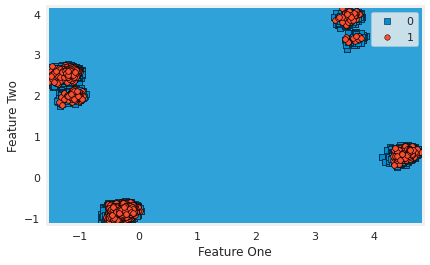

In [ ]:
plot_model(best_models[0],"boundary",use_train_data=True)

Using Test Data

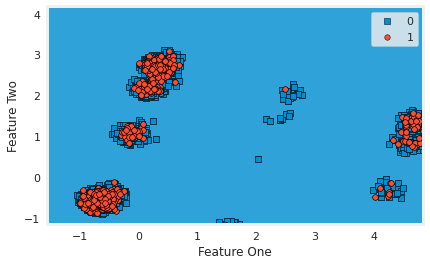

In [ ]:
plot_model(best_models[0],"boundary",use_train_data=False)

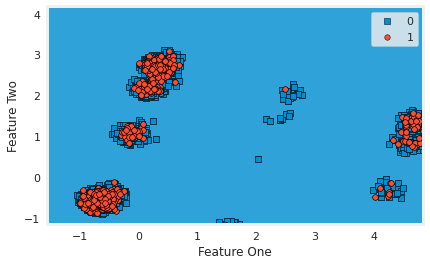

In [ ]:
plot_model(best_models[1],"boundary")

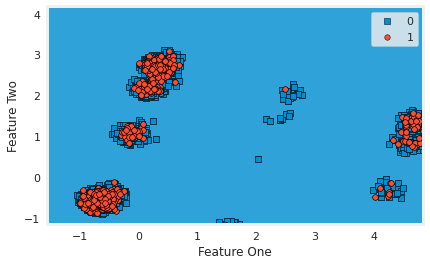

In [ ]:
plot_model(best_models[2],"boundary")

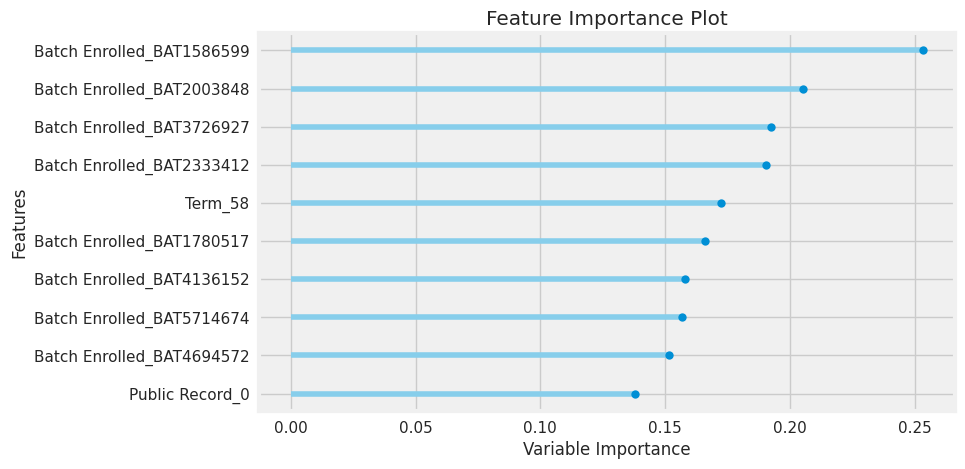

In [ ]:
plot_model(best_models[0],plot="feature")

###HyperParameter Tuning

***!!!will take some time!!!***

In [ ]:
tuned_model_0 = tune_model(best_models[0],optimize="Log Loss",early_stopping=True,
                          
                          choose_better=True,tuner_verbose=True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9084,0.5434,0.0,0.0,0.0,0.0,0.0,3.1637
1,0.9084,0.5168,0.0,0.0,0.0,0.0,0.0,3.1637
2,0.9084,0.5490,0.0,0.0,0.0,0.0,0.0,3.1644
3,0.9084,0.4971,0.0,0.0,0.0,0.0,0.0,3.1644
4,0.9084,0.5423,0.0,0.0,0.0,0.0,0.0,3.1644
5,0.9084,0.5530,0.0,0.0,0.0,0.0,0.0,3.1644
6,0.9084,0.5043,0.0,0.0,0.0,0.0,0.0,3.1644
7,0.9084,0.5315,0.0,0.0,0.0,0.0,0.0,3.1644
8,0.9084,0.5427,0.0,0.0,0.0,0.0,0.0,3.1644
9,0.9084,0.5163,0.0,0.0,0.0,0.0,0.0,3.1644


In [ ]:
plot_model(tuned_model_0,"boundary")

In [ ]:
#tuned_model_1 = tune_model(best_models[1],optimize="Log Loss",early_stopping=True,choose_better=True,tuner_verbose=True)

In [ ]:
plot_model(tuned_model_0,"boundary")

In [ ]:
predict_model(tuned_model_0)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Logistic Regression,0.9075,0.5268,0.0,0.0,0.0,0.0,0.0,3.1947


,Batch Enrolled_BAT4136152,new_Loan Title,Batch Enrolled_BAT1104812,Batch Enrolled_BAT1766061,Batch Enrolled_BAT224923,Batch Enrolled_others_infrequent,Inquires - six months_2,Collection Recovery Fee,Batch Enrolled_BAT5525466,Total Received Interest,Delinquency - two years_0,Batch Enrolled_BAT4351734,Batch Enrolled_BAT5341619,Total Accounts,Batch Enrolled_BAT4808022,Term_58,Last week Pay,Verification Status,Batch Enrolled_BAT2333412,Batch Enrolled_BAT3461431,Batch Enrolled_BAT4271519,Employment Duration,Funded Amount,Total Received Late Fee,Open Account,Batch Enrolled_BAT5489674,Batch Enrolled_BAT1780517,Batch Enrolled_BAT2078974,Initial List Status,Total Revolving Credit Limit,Batch Enrolled_BAT2428731,Batch Enrolled_BAT2833642,Inquires - six months_1,Batch Enrolled_BAT3726927,Batch Enrolled_BAT3873588,Loan Amount,Batch Enrolled_BAT5714674,Batch Enrolled_BAT5924421,Batch Enrolled_BAT5547201,Public Record_0,Debit to Income,Batch Enrolled_BAT1761981,Batch Enrolled_BAT1930365,Delinquency - two years_2,Home Ownership,Batch Enrolled_BAT2252229,Batch Enrolled_BAT4694572,Batch Enrolled_BAT2003848,Batch Enrolled_BAT2575549,Recoveries,Funded Amount Investor,Batch Enrolled_BAT5629144,Batch Enrolled_BAT4722912,Total Collection Amount,Term_36,Delinquency - two years_1,Batch Enrolled_BAT2803411,Interest Rate,Grade,Revolving Utilities,Batch Enrolled_BAT1586599,Batch Enrolled_BAT1184694,Batch Enrolled_BAT3193689,Revolving Balance,Batch Enrolled_BAT2558388,Subgrade_new,Batch Enrolled_BAT2136391,Inquires - six months_0,Total Current Balance,Batch Enrolled_BAT2522922,Loan Status,Label,Score
0,0.0,-0.395935,0.0,0.0,0.0,0.0,0.0,0.225871,0.0,0.265501,1.0,0.0,0.0,-1.101762,0.0,0.0,-0.381742,0.0,0.0,0.0,0.0,0.0,0.095052,-0.471468,-0.170755,1.0,0.0,0.0,0.0,-1.032969,0.0,0.0,0.0,0.0,0.0,0.473282,0.0,0.0,0.0,1.0,1.057207,0.0,0.0,0.0,0.639250,0.0,0.0,0.0,0.0,-0.315161,0.151199,0.0,0.0,3.095836,0.0,0.0,0.0,0.778048,1.0,0.865765,0.0,0.0,0.0,0.183736,0.0,0.0,0.0,1.0,-0.647047,0.0,0,0,0.9088
1,0.0,0.925424,0.0,0.0,0.0,0.0,0.0,-1.653667,0.0,2.021628,0.0,0.0,0.0,-1.101762,0.0,0.0,1.309119,2.0,0.0,0.0,0.0,2.0,1.194532,0.002391,-0.170755,0.0,0.0,0.0,0.0,1.109772,0.0,0.0,0.0,0.0,0.0,-0.000216,0.0,0.0,1.0,1.0,-0.327531,0.0,0.0,0.0,-0.983803,0.0,0.0,0.0,0.0,0.333267,0.276937,0.0,0.0,-0.602117,0.0,1.0,0.0,-0.658207,3.0,1.219875,0.0,0.0,0.0,-0.042184,0.0,4.0,0.0,1.0,-1.079892,0.0,0,0,0.8771
2,0.0,0.925424,0.0,0.0,0.0,0.0,0.0,1.135255,0.0,-0.109079,1.0,0.0,0.0,1.414533,0.0,0.0,1.646390,1.0,0.0,0.0,0.0,1.0,-0.100494,-0.208255,2.177289,0.0,0.0,0.0,1.0,1.265560,0.0,0.0,0.0,0.0,0.0,0.223152,0.0,0.0,0.0,1.0,1.710280,0.0,0.0,0.0,-0.081547,0.0,0.0,1.0,0.0,0.349876,1.072700,0.0,0.0,-0.049746,0.0,0.0,0.0,1.739294,2.0,0.210378,0.0,0.0,0.0,-1.276096,0.0,0.0,0.0,1.0,-1.415550,0.0,0,0,0.8912
3,0.0,-0.395935,0.0,0.0,0.0,1.0,0.0,1.001861,0.0,0.815234,1.0,0.0,0.0,-0.088607,0.0,0.0,1.683119,1.0,0.0,0.0,0.0,1.0,-0.524856,-0.418275,1.116989,0.0,0.0,0.0,1.0,0.980032,0.0,0.0,0.0,0.0,0.0,0.069360,0.0,0.0,0.0,1.0,1.834792,0.0,0.0,0.0,-0.881432,0.0,0.0,0.0,0.0,-0.815994,1.454647,0.0,0.0,-0.198992,0.0,0.0,0.0,0.390935,4.0,0.463130,0.0,0.0,0.0,1.635977,0.0,4.0,0.0,1.0,0.668645,0.0,1,0,0.8938
4,0.0,-2.143229,0.0,0.0,0.0,0.0,0.0,3.413790,0.0,-0.063770,0.0,0.0,0.0,-1.751277,0.0,0.0,-0.771079,1.0,0.0,0.0,0.0,1.0,-0.480862,-0.526497,-0.440052,0.0,0.0,0.0,0.0,0.075105,0.0,0.0,0.0,0.0,0.0,-1.289607,0.0,0.0,0.0,1.0,-0.023123,0.0,1.0,1.0,-0.559223,0.0,0.0,0.0,0.0,0.055142,-1.374118,0.0,0.0,0.360203,0.0,0.0,0.0,0.771371,0.0,-0.478260,0.0,0.0,0.0,1.150537,0.0,2.0,0.0,1.0,-1.497441,0.0,0,0,0.9116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20234,0.0,-0.395935,0.0,0.0,0.0,1.0,0.0,0.197750,0.0,0.068757,1.0,0.0,0.0,-0.088607,0.0,1.0,0.080583,2.0,0.0,0.0,0.0,1

In [ ]:
tuned_model_0#AFTER TUNING best no of estimators may be changed

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
final = finalize_model(tuned_model_0)

In [ ]:
final

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

###Making Predictions

columns in unseen data other than independent columns used for training are ignored

In [ ]:
import pandas as pd

In [ ]:
save_model(final,"Final_model")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=False,
                                       features_todrop=['ID', 'Loan Title',
                                                        'Sub Grade'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='Loan Status', time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_val...
                                        target_variable='Loan Status',
                                        threshold=0.9)),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
              

In [ ]:
modelload = load_model('Final_model')

Transformation Pipeline and Model Successfully Loaded


Loan title arrangement

In [ ]:
test_data['new_Loan Title'] = test_data['Loan Title'].replace(['cc refi','cc-refinance'],'cc refinance')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['bill consolidation','bills'],'bill payoff')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace('car financing','car loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['cc','cc consolidation','cc loan'],'cc refinance')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['card consolidation','cards','credit card','credit cards'],'credit card consolidation')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['conso','consolidate','consolidated','consolidation'],'consolidation loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace('credit card pay off','credit card payoff')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['credit card refi','credit card refinance loan','credit card refinancing'],'credit card refinance')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['credit','credit loan','credit pay off'],'credit payoff')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['debt consolidation','debt consolidation 2013','dept consolidation'],'debt consolidation loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['debt','debt free','debt payoff','debt reduction','freedom','get debt free','get out of debt'],'debt loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['home','home buying','home improvement','home improvement loan','house'],'home loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace('loan1','loan 1')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['medical','medical expenses'],'medical loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace('myloan','my loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['payoff','pay off bills'],'pay off')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['personal'],'personal loan')

In [ ]:
test_data['new_Loan Title'] = test_data['new_Loan Title'].replace(['refi','refinance'],'refinance loan')

Sub grade column

In [ ]:
test_data['Subgrade_new']=test_data['Sub Grade'].replace(['A2','A3','A4','A5'],'A1')

In [ ]:
test_data['Subgrade_new']=test_data['Subgrade_new'].replace(['B2','B3','B4','B5'],'B1')

In [ ]:
test_data['Subgrade_new']=test_data['Subgrade_new'].replace(['C2','C3','C4','C5'],'C1')

In [ ]:
test_data['Subgrade_new']=test_data['Subgrade_new'].replace(['D2','D3','D4','D5'],'D1')

In [ ]:
test_data['Subgrade_new']=test_data['Subgrade_new'].replace(['E2','E3','E4','E5'],'E1')

In [ ]:
test_data['Subgrade_new']=test_data['Subgrade_new'].replace(['F2','F3','F4','F5'],'F1')

In [ ]:
test_data['Subgrade_new']=test_data['Subgrade_new'].replace(['G2','G3','G4','G5'],'G1')

In [ ]:
test_data.head()

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status,new_Loan Title,Subgrade_new
0,56492997,17120,10365,16025.082690,59,BAT2575549,12.163926,A,D1,RENT,76468.82190,Source Verified,n,home improvement,16.749219,1,0,12,1,3576,67.278287,5,f,4469.449851,0.088031,8.425776,0.731797,0,INDIVIDUAL,135,0,24,475442,4364,NaN,home loan,D1
1,22540813,7133,11650,12615.795600,59,BAT2833642,6.564296,B,E3,MORTGAGE,38079.01344,Source Verified,n,credit card refinancing,18.157975,0,0,11,0,1932,71.313157,21,w,993.907530,0.041237,6.157008,0.992918,0,INDIVIDUAL,56,0,1,72412,2573,NaN,credit card refinance,E1
2,9862181,25291,25825,11621.280830,59,BAT1761981,14.729900,A,C3,MORTGAGE,51275.93268,Source Verified,n,debt consolidation,15.190011,0,0,22,0,598,50.883065,23,f,729.113379,0.021745,5.705077,0.281580,0,INDIVIDUAL,3,0,26,284825,19676,NaN,debt consolidation loan,C1
3,10097822,30781,9664,15375.823510,59,BAT5341619,10.523767,A,A2,RENT,68867.98965,Verified,n,debt consolidation,21.292550,0,0,11,0,5222,82.449083,28,w,715.867091,0.092398,2.469688,0.959162,0,INDIVIDUAL,21,0,32,40842,7226,NaN,debt consolidation loan,A1
4,47771809,8878,9419,7176.647582,58,BAT4694572,9.997013,C,B3,OWN,91556.85423,Verified,n,debt consolidation,4.812117,0,0,11,0,553,49.075855,9,w,248.572854,0.010354,2.127835,0.402315,0,INDIVIDUAL,104,0,33,90825,26145,NaN,debt consolidation loan,B1


In [ ]:
unseen_predictions = predict_model(modelload,data=test_data)
unseen_predictions

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Batch Enrolled,Interest Rate,Grade,Sub Grade,Employment Duration,Home Ownership,Verification Status,Payment Plan,Loan Title,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,Public Record,Revolving Balance,Revolving Utilities,Total Accounts,Initial List Status,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status,new_Loan Title,Subgrade_new,Label,Score
0,56492997,17120,10365,16025.082690,59,BAT2575549,12.163926,A,D1,RENT,76468.82190,Source Verified,n,home improvement,16.749219,1,0,12,1,3576,67.278287,5,f,4469.449851,0.088031,8.425776,0.731797,0,INDIVIDUAL,135,0,24,475442,4364,NaN,home loan,D1,0,0.8825
1,22540813,7133,11650,12615.795600,59,BAT2833642,6.564296,B,E3,MORTGAGE,38079.01344,Source Verified,n,credit card refinancing,18.157975,0,0,11,0,1932,71.313157,21,w,993.907530,0.041237,6.157008,0.992918,0,INDIVIDUAL,56,0,1,72412,2573,NaN,credit card refinance,E1,0,0.9284
2,9862181,25291,25825,11621.280830,59,BAT1761981,14.729900,A,C3,MORTGAGE,51275.93268,Source Verified,n,debt consolidation,15.190011,0,0,22,0,598,50.883065,23,f,729.113379,0.021745,5.705077,0.281580,0,INDIVIDUAL,3,0,26,284825,19676,NaN,debt consolidation loan,C1,0,0.8984
3,10097822,30781,9664,15375.823510,59,BAT5341619,10.523767,A,A2,RENT,68867.98965,Verified,n,debt consolidation,21.292550,0,0,11,0,5222,82.449083,28,w,715.867091,0.092398,2.469688,0.959162,0,INDIVIDUAL,21,0,32,40842,7226,NaN,debt consolidation loan,A1,0,0.9225
4,47771809,8878,9419,7176.647582,58,BAT4694572,9.997013,C,B3,OWN,91556.85423,Verified,n,debt consolidation,4.812117,0,0,11,0,553,49.075855,9,w,248.572854,0.010354,2.127835,0.402315,0,INDIVIDUAL,104,0,33,90825,26145,NaN,debt consolidation loan,B1,0,0.9036
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28908,11537800,35000,35000,35000.000000,60,BAT5629144,16.240000,C,C5,MORTGAGE,360000.00000,Verified,n,credit card refinancing,7.310000,0,0,8,1,83274,72.200000,16,f,10116.330000,0.000000,0.000000,0.000000,0,INDIVIDUAL,109,0,0,883984,114000,NaN,credit card refinance,C1,0,0.8591
28909,11538258,25000,25000,25000.000000,60,BAT5629144,14.980000,C,C3,MORTGAGE,105000.00000,Source Verified,n,debt consolidation,10.220000,0,1,10,0,26356,50.900000,26,f,6493.950000,0.000000,0.000000,0.000000,0,INDIVIDUAL,104,0,0,513925,51800,NaN,debt consolidation loan,C1,0,0.8812
28910,13147685,30000,30000,29950.000000,60,BAT2136391,18.240000,D,D5,MORTGAGE,74100.00000,Verified,n,debt consolidation,27.300000,0,0,19,0,31303,47.700000,45,f,7785.190000,0.000000,0.000000,0.000000,1,INDIVIDUAL,83,0,0,296294,65600,NaN,debt consolidation loan,D1,0,0.8945
28911,13917689,25000,25000,24950.000000,60,BAT2136391,15.610000,D,D1,MORTGAGE,130000.00000,Verified,n,debt consolidation,27.290000,2,0,12,0,25470,83.800000,34,f,5513.520000,0.000000,0.000000,0.000000,0,INDIVIDUAL,83,0,0,428723,30400,NaN,debt consolidation loan,D1,0,0.8817


**Pickling ml model file**

###Submission

In [ ]:
unseen_predictions['Label'].to_csv("/content/submission.csv",index=False)